<a href="https://colab.research.google.com/github/escuccim/Faceswap-Deepfake-Pytorch/blob/master/PyTorchFaceSwap_128m.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Based on https://github.com/Oldpan/Faceswap-Deepfake-Pytorch, I have made several changes:
 - replaced the PixelShuffler with transpose convolutions because it makes more sense to do it that way.
 - replaced the sigmoids with tanhs, because I think it's a better activation function in this context.
 - implemented pytorch dataloaders to load the data; replaced the cv2 transformations with torchvision transforms where possible. This seems slower, but it may be due to the fact that we are no longer training on one batch per epoch. This also allows us to train on more data than can fit into RAM.
 - replaced the code to plot the images during training with something that is easier to understand. The old code did some weird transposes that didn't work properly when loading the data from dataloaders.
 - removed 3x3 normal conv from decoder and replaced with a transpose conv with stride 1 to attempt to smooth out artifacts.

**Issues**

 - I have some concerns about using a normal convolution at the end of the Decoding, this may be changed after I see how the results are.
 - The images seem to have more deconv-related artifacts than the original code did, resulting in more pixelated and less smooth output. This may need to be addressed after we see how the results are after training.

**Updates**

 - Replacing the last conv in the decoder with a transpose conv with stride 1 made the decoded images much better, but the swapped images were of significantly worse quality. I removed this and replaced the old conv, changing it to 3x3 from 5x5.
 - b : The original model was too big, I am reducing the size because there isn't really enough data to train such a large model.
 - c : Removing even more parameters
 - d : Adding some parameters back to encoder
 - e : Same as d, but using three decoders so encoder is trained to encode a lot more images than just for two people. This should make it quicker and easier to re-train for new people.
 - f : Adding some parameters to encoder and decoder as it seems to have trouble with the larger dataset.
 - g : Removing some params from encoder for faster training ?
 - h : Adding more parameters back to decoder
 - i : Tweaking decoder
 - j : Last version wasn't learning much after a lot of epochs, so reverting the decoder
 - l : Adding even more params
 

In [ ]:
!nvidia-smi

Fri Aug 21 07:40:47 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.57       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   64C    P8    12W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install -q torch==1.4.0 torchvision==0.5.0

     |████████████████████████████████| 753.4MB 22kB/s 
     |████████████████████████████████| 4.0MB 38.9MB/s 


In [ ]:
import torch
import torchvision
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt, colors
%matplotlib inline
import zipfile
import os
import matplotlib.animation as animation
import torchvision.utils as vutils
import numpy as np
import random
import shutil
import pandas as pd
import torch.nn.functional as F
from torch.autograd import Variable
from torch.utils.data import Dataset
from torch.optim import RMSprop,Adam,SGD
from torch.optim.lr_scheduler import ExponentialLR,MultiStepLR
import progressbar
from torchvision.utils import make_grid
from torchvision import models
from scipy.io import loadmat
from google.colab import auth
import PIL
import torch.utils.data
from torch import nn, optim
import torch.backends.cudnn as cudnn
import numpy
import torch.utils.data
from torch.nn import functional as F
import math
from torch.nn.parameter import Parameter
from torch.nn.functional import pad
import cv2
from torch.nn.modules import Module
from torch.nn.modules.utils import _single, _pair, _triple

from google.colab.patches import cv2_imshow
auth.authenticate_user()

# upload checkpoint to GCS
project_id = 'mammography-198911'
bucket_name = 'gan-faces'

!gcloud config set project {project_id}

Updated property [core/project].


To take a quick anonymous survey, run:
  $ gcloud survey



In [ ]:
print(torch.__version__)

1.4.0


In [ ]:
# download the model checkpoint
!mkdir checkpoint
!gsutil cp gs://{bucket_name}/autoencoder128m.pt ./checkpoint/autoencoder128m.pt

Copying gs://gan-faces/autoencoder128m.pt...
- [1 files][  3.0 GiB/  3.0 GiB]   32.0 MiB/s                                   
Operation completed over 1 objects/3.0 GiB.                                      


In [ ]:
if not os.path.exists("data/female"):
    !mkdir data
    !mkdir data/female
    !mkdir data/male

# if not os.path.exists("celeba-dataset.zip"):
# #   !kaggle datasets download -d jessicali9530/celeba-dataset
#   !gsutil cp gs://{bucket_name}/celeba-dataset.zip ./celeba-dataset.zip
#   zip_ref = zipfile.ZipFile('celeba-dataset.zip', 'r')
#   zip_ref.extractall('data')
#   zip_ref.close()

#   zip_ref = zipfile.ZipFile('data/img_align_celeba.zip', 'r')
#   zip_ref.extractall('data/images')
#   zip_ref.close()

# if not os.path.exists("imdb_crop_good.zip"):  
#   !gsutil cp gs://{bucket_name}/imdb_crop_good.zip ./imdb_crop_good.zip
#   zip_ref = zipfile.ZipFile('imdb_crop_good.zip', 'r')
#   zip_ref.extractall('data/images/imdb')
#   zip_ref.close()

# if not os.path.exists("celeba_by_age.zip"):  
#   !gsutil cp gs://{bucket_name}/celeba_by_age.zip ./celeba_by_age.zip
#   zip_ref = zipfile.ZipFile('celeba_by_age.zip', 'r')
#   zip_ref.extractall('data_celeb_age')
#   zip_ref.close()

# if not os.path.exists("celeba_by_gender.zip"):  
#   !gsutil cp gs://{bucket_name}/celeba_by_gender.zip ./celeba_by_gender.zip
#   zip_ref = zipfile.ZipFile('celeba_by_gender.zip', 'r')
#   zip_ref.extractall('data_celeb')
#   zip_ref.close()
#   !mv data_celeb/celeba/female/ data/female/
#   !mv data_celeb/celeba/male/ data/male/

if not os.path.exists("named_celebs_good_by_gender.zip"):  
  !gsutil cp gs://{bucket_name}/named_celebs_good_by_gender.zip ./named_celebs_good_by_gender.zip
  zip_ref = zipfile.ZipFile('named_celebs_good_by_gender.zip', 'r')
  zip_ref.extractall('data')
  zip_ref.close()
  !mv data/named_celebs_good_by_gender/female/* data/female/
  !mv data/named_celebs_good_by_gender/male/* data/male/

Copying gs://gan-faces/named_celebs_good_by_gender.zip...
- [1 files][ 75.9 MiB/ 75.9 MiB]   15.3 MiB/s                                   
Operation completed over 1 objects/75.9 MiB.                                     


In [ ]:
random_transform_args = {
    'rotation_range': 10,
    'zoom_range': 0.05,
    'shift_range': 0.05,
    'random_flip': 0.4,
}

def get_training_data(images, batch_size):
    indices = numpy.random.randint(len(images), size=batch_size)
    for i, index in enumerate(indices):
        image = images[index]
        image = random_transform(image, **random_transform_args)
        warped_img, target_img = random_warp(image)

        if i == 0:
            warped_images = numpy.empty((batch_size,) + warped_img.shape, warped_img.dtype)
            target_images = numpy.empty((batch_size,) + target_img.shape, warped_img.dtype)

        warped_images[i] = warped_img
        target_images[i] = target_img

    return warped_images, target_images

def get_image_paths(directory):
    return [x.path for x in os.scandir(directory) if x.name.endswith(".jpg") or x.name.endswith(".png")
            or x.name.endswith(".JPG")]


def load_images(image_paths, convert=None):
    iter_all_images = (cv2.resize(cv2.imread(fn), (256, 256)) for fn in image_paths)
    if convert:
        iter_all_images = (convert(img) for img in iter_all_images)
    for i, image in enumerate(iter_all_images):
        if i == 0:
            all_images = numpy.empty((len(image_paths),) + image.shape, dtype=image.dtype)
        all_images[i] = image

# # License (Modified BSD) # Copyright (C) 2011, the scikit-image team All rights reserved. # # Redistribution and
# use in source and binary forms, with or without modification, are permitted provided that the following conditions
# are met: # # Redistributions of source code must retain the above copyright notice, this list of conditions and the
#  following disclaimer. # Redistributions in binary form must reproduce the above copyright notice, this list of
# conditions and the following disclaimer in the documentation and/or other materials provided with the distribution.
#  Neither the name of skimage nor the names of its contributors may be used to endorse or promote products derived
# from this software without specific prior written permission. # THIS SOFTWARE IS PROVIDED BY THE AUTHOR ``AS IS''
# AND ANY EXPRESS OR IMPLIED WARRANTIES, INCLUDING, BUT NOT LIMITED TO, THE IMPLIED WARRANTIES OF MERCHANTABILITY AND
#  FITNESS FOR A PARTICULAR PURPOSE ARE DISCLAIMED. IN NO EVENT SHALL THE AUTHOR BE LIABLE FOR ANY DIRECT, INDIRECT,
# INCIDENTAL, SPECIAL, EXEMPLARY, OR CONSEQUENTIAL DAMAGES (INCLUDING, BUT NOT LIMITED TO, PROCUREMENT OF SUBSTITUTE
# GOODS OR SERVICES; LOSS OF USE, DATA, OR PROFITS; OR BUSINESS INTERRUPTION) HOWEVER CAUSED AND ON ANY THEORY OF
# LIABILITY, WHETHER IN CONTRACT, STRICT LIABILITY, OR TORT (INCLUDING NEGLIGENCE OR OTHERWISE) ARISING IN ANY WAY
# OUT OF THE USE OF THIS SOFTWARE, EVEN IF ADVISED OF THE POSSIBILITY OF SUCH DAMAGE.

# umeyama function from scikit-image/skimage/transform/_geometric.py

import numpy as np


def umeyama(src, dst, estimate_scale):
    """Estimate N-D similarity transformation with or without scaling.
    Parameters
    ----------
    src : (M, N) array
        Source coordinates.
    dst : (M, N) array
        Destination coordinates.
    estimate_scale : bool
        Whether to estimate scaling factor.
    Returns
    -------
    T : (N + 1, N + 1)
        The homogeneous similarity transformation matrix. The matrix contains
        NaN values only if the problem is not well-conditioned.
    References
    ----------
    .. [1] "Least-squares estimation of transformation parameters between two
            point patterns", Shinji Umeyama, PAMI 1991, DOI: 10.1109/34.88573
    """

    num = src.shape[0]
    dim = src.shape[1]

    # Compute mean of src and dst.
    src_mean = src.mean(axis=0)
    dst_mean = dst.mean(axis=0)

    # Subtract mean from src and dst.
    src_demean = src - src_mean
    dst_demean = dst - dst_mean

    # Eq. (38).
    A = np.dot(dst_demean.T, src_demean) / num

    # Eq. (39).
    d = np.ones((dim,), dtype=np.double)
    if np.linalg.det(A) < 0:
        d[dim - 1] = -1

    T = np.eye(dim + 1, dtype=np.double)

    U, S, V = np.linalg.svd(A)

    # Eq. (40) and (43).
    rank = np.linalg.matrix_rank(A)
    if rank == 0:
        return np.nan * T
    elif rank == dim - 1:
        if np.linalg.det(U) * np.linalg.det(V) > 0:
            T[:dim, :dim] = np.dot(U, V)
        else:
            s = d[dim - 1]
            d[dim - 1] = -1
            T[:dim, :dim] = np.dot(U, np.dot(np.diag(d), V))
            d[dim - 1] = s
    else:
        T[:dim, :dim] = np.dot(U, np.dot(np.diag(d), V.T))

    if estimate_scale:
        # Eq. (41) and (42).
        scale = 1.0 / src_demean.var(axis=0).sum() * np.dot(S, d)
    else:
        scale = 1.0

    T[:dim, dim] = dst_mean - scale * np.dot(T[:dim, :dim], src_mean.T)
    T[:dim, :dim] *= scale

    return T

random_transform_args = {
    'rotation_range': 10,
    'zoom_range': 0.05,
    'shift_range': 0.05,
    'random_flip': 0.5,
}


def random_transform(image, rotation_range, zoom_range, shift_range, random_flip):
    h, w = image.shape[0:2]
    rotation = numpy.random.uniform(-rotation_range, rotation_range)
    scale = numpy.random.uniform(1 - zoom_range, 1 + zoom_range)
    tx = numpy.random.uniform(-shift_range, shift_range) * w
    ty = numpy.random.uniform(-shift_range, shift_range) * h
    mat = cv2.getRotationMatrix2D((w // 2, h // 2), rotation, scale)
    mat[:, 2] += (tx, ty)
    result = cv2.warpAffine(image, mat, (w, h), borderMode=cv2.BORDER_REPLICATE)
    if numpy.random.random() < random_flip:
        result = result[:, ::-1]
    return result


# get pair of random warped images from aligened face image
def random_warp(image):
    assert image.shape == (256, 256, 3)
    image = random_transform(image, **random_transform_args)
    range_ = numpy.linspace(128 - 100, 128 + 100, 10)
    mapx = numpy.broadcast_to(range_, (10,10))
    mapy = mapx.T

    mapx = mapx + numpy.random.normal(size=(10,10), scale=2.5)
    mapy = mapy + numpy.random.normal(size=(10,10), scale=2.5)

    interp_mapx = cv2.resize(mapx, (160,160))[16:-16, 16:-16].astype('float32')
    interp_mapy = cv2.resize(mapy, (160,160))[16:-16, 16:-16].astype('float32')

    warped_image = cv2.remap(image, interp_mapx, interp_mapy, cv2.INTER_LINEAR)

    src_points = numpy.stack([mapx.ravel(), mapy.ravel()], axis=-1)
    dst_points = numpy.mgrid[0:160:16, 0:160:16].T.reshape(-1, 2)
    mat = umeyama(src_points, dst_points, True)[0:2]

    target_image = cv2.warpAffine(image, mat, (128,128))

    return warped_image, target_image    

random_transform_args = {
    'rotation_range': 10,
    'zoom_range': 0.05,
    'shift_range': 0.05,
    'random_flip': 0.4,
}


def get_training_data(images, batch_size):
    indices = numpy.random.randint(len(images), size=batch_size)
    for i, index in enumerate(indices):
        image = images[index]
        image = random_transform(image, **random_transform_args)
        warped_img, target_img = random_warp(image)

        if i == 0:
            warped_images = numpy.empty((batch_size,) + warped_img.shape, warped_img.dtype)
            target_images = numpy.empty((batch_size,) + target_img.shape, warped_img.dtype)

        warped_images[i] = warped_img
        target_images[i] = target_img

    return warped_images, target_images

def get_image_paths(directory):
    return [x.path for x in os.scandir(directory) if x.name.endswith(".jpg") or x.name.endswith(".png")
            or x.name.endswith(".JPG")]


def load_images(image_paths, convert=None):
    iter_all_images = (cv2.resize(cv2.imread(fn), (256, 256)) for fn in image_paths)
    if convert:
        iter_all_images = (convert(img) for img in iter_all_images)
    for i, image in enumerate(iter_all_images):
        if i == 0:
            all_images = numpy.empty((len(image_paths),) + image.shape, dtype=image.dtype)
        all_images[i] = image
    return all_images

In [ ]:
image_size = (256,256)
data_path_gender = "data/"
batch_size = 64

transformations = torchvision.transforms.Compose([
    # [torchvision.transforms.RandomHorizontalFlip(p=0.5), 
    #  torchvision.transforms.RandomRotation((-15,15), resample=False, expand=False),
     torchvision.transforms.RandomResizedCrop(image_size, scale=(0.80, 1.05)),
     torchvision.transforms.ColorJitter(brightness=0.10, contrast=0.10, saturation=0.05, hue=0.025)
    ])

transform_normalize = torchvision.transforms.Compose([
      torchvision.transforms.ToTensor(),
      # torchvision.transforms.Normalize((0.0, 0.0, 0.0), (1.0, 1.0, 1.0))
    ])

warp_transform = torchvision.transforms.Lambda(lambda x: random_warp(x))

class SkewedImageFolder(torchvision.datasets.ImageFolder):
  def __getitem__(self, index):
        """
        Args:
            index (int): Index
        Returns:
            tuple: (sample, target) where target is class_index of the target class.
        """
        path, target = self.samples[index]
        # load the sample
        sample = self.loader(path)

        # apply the transformations
        if self.transform is not None:
            sample = self.transform(sample)
        
        # apply the random warping
        sample, target = warp_transform(np.array(sample))

        # normalize
        sample = transform_normalize(sample)
        target = transform_normalize(target)

        return sample, target

train_dataset_all = SkewedImageFolder(
        root=data_path_gender,
        transform=transformations
    )

train_loader_all = torch.utils.data.DataLoader(
    train_dataset_all,
    batch_size=batch_size,
    num_workers=1,
    shuffle=True
)        

train_dataset_male = SkewedImageFolder(
        root=data_path_gender + "male",
        transform=transformations
    )

train_loader_male = torch.utils.data.DataLoader(
    train_dataset_male,
    batch_size=batch_size,
    num_workers=1,
    shuffle=True
)        

train_dataset_female = SkewedImageFolder(
        root=data_path_gender + "female",
        transform=transformations
    )

train_loader_female = torch.utils.data.DataLoader(
    train_dataset_female,
    batch_size=batch_size,
    num_workers=1,
    shuffle=True
)        

train_dataset_A = SkewedImageFolder(
        root=data_path_gender + "female/Angelina_Jolie",
        transform=transformations
    )

train_loader_A = torch.utils.data.DataLoader(
    train_dataset_A,
    batch_size=batch_size,
    num_workers=1,
    shuffle=True
)        

train_dataset_B = SkewedImageFolder(
        root=data_path_gender + "male/Brad_Pitt",
        transform=transformations
    )

train_loader_B = torch.utils.data.DataLoader(
    train_dataset_B,
    batch_size=batch_size,
    num_workers=1,
    shuffle=True
)        

print(train_dataset_male)
print(train_dataset_female)        

Dataset SkewedImageFolder
    Number of datapoints: 2352
    Root location: data/male
    StandardTransform
Transform: Compose(
               RandomResizedCrop(size=(256, 256), scale=(0.8, 1.05), ratio=(0.75, 1.3333), interpolation=PIL.Image.BILINEAR)
               ColorJitter(brightness=[0.9, 1.1], contrast=[0.9, 1.1], saturation=[0.95, 1.05], hue=[-0.025, 0.025])
           )
Dataset SkewedImageFolder
    Number of datapoints: 2732
    Root location: data/female
    StandardTransform
Transform: Compose(
               RandomResizedCrop(size=(256, 256), scale=(0.8, 1.05), ratio=(0.75, 1.3333), interpolation=PIL.Image.BILINEAR)
               ColorJitter(brightness=[0.9, 1.1], contrast=[0.9, 1.1], saturation=[0.95, 1.05], hue=[-0.025, 0.025])
           )


inputs torch.Size([64, 3, 128, 128])
labels torch.Size([64, 3, 128, 128])


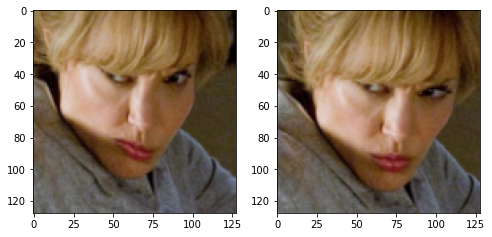

inputs torch.Size([64, 3, 128, 128])
labels torch.Size([64, 3, 128, 128])


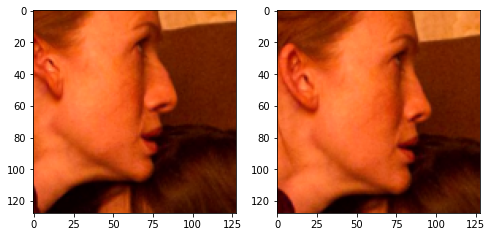

inputs torch.Size([64, 3, 128, 128])
labels torch.Size([64, 3, 128, 128])


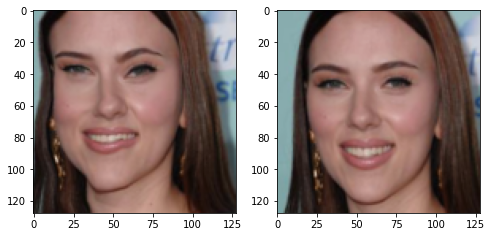

In [ ]:
for (inputs, labels) in train_loader_A:
    print("inputs", inputs.shape)
    print("labels", labels.shape)
    # inputs = (inputs * 0.5) + 0.5
    # labels = (labels * 0.5) + 0.5
    fig, ax = plt.subplots(1, 2, figsize=(8,6))
    ax[0].imshow(np.transpose(inputs[0].detach().cpu(), (1,2,0)))
    ax[1].imshow(np.transpose(labels[0].detach().cpu(), (1,2,0)))
    plt.show()

    break

for (inputs, labels) in train_loader_B:
    print("inputs", inputs.shape)
    print("labels", labels.shape)
    # inputs = (inputs * 0.5) + 0.5
    # labels = (labels * 0.5) + 0.5
    fig, ax = plt.subplots(1, 2, figsize=(8,6))
    ax[0].imshow(np.transpose(inputs[0].detach().cpu(), (1,2,0)))
    ax[1].imshow(np.transpose(labels[0].detach().cpu(), (1,2,0)))
    plt.show()
    break    

for (inputs, labels) in train_loader_all:
    print("inputs", inputs.shape)
    print("labels", labels.shape)
    # inputs = (inputs * 0.5) + 0.5
    # labels = (labels * 0.5) + 0.5
    fig, ax = plt.subplots(1, 2, figsize=(8,6))
    ax[0].imshow(np.transpose(inputs[0].detach().cpu(), (1,2,0)))
    ax[1].imshow(np.transpose(labels[0].detach().cpu(), (1,2,0)))
    plt.show()
    break        

In [ ]:
class _ConvNd(Module):

    def __init__(self, in_channels, out_channels, kernel_size, stride,
                 padding, dilation, transposed, output_padding, groups, bias):
        super(_ConvNd, self).__init__()
        if in_channels % groups != 0:
            raise ValueError('in_channels must be divisible by groups')
        if out_channels % groups != 0:
            raise ValueError('out_channels must be divisible by groups')
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.kernel_size = kernel_size
        self.stride = stride
        self.padding = padding
        self.dilation = dilation
        self.transposed = transposed
        self.output_padding = output_padding
        self.groups = groups
        if transposed:
            self.weight = Parameter(torch.Tensor(
                in_channels, out_channels // groups, *kernel_size))
        else:
            self.weight = Parameter(torch.Tensor(
                out_channels, in_channels // groups, *kernel_size))
        if bias:
            self.bias = Parameter(torch.Tensor(out_channels))
        else:
            self.register_parameter('bias', None)
        self.reset_parameters()

    def reset_parameters(self):
        n = self.in_channels
        for k in self.kernel_size:
            n *= k
        stdv = 1. / math.sqrt(n)
        self.weight.data.uniform_(-stdv, stdv)
        if self.bias is not None:
            self.bias.data.uniform_(-stdv, stdv)

    def __repr__(self):
        s = ('{name}({in_channels}, {out_channels}, kernel_size={kernel_size}'
             ', stride={stride}')
        if self.padding != (0,) * len(self.padding):
            s += ', padding={padding}'
        if self.dilation != (1,) * len(self.dilation):
            s += ', dilation={dilation}'
        if self.output_padding != (0,) * len(self.output_padding):
            s += ', output_padding={output_padding}'
        if self.groups != 1:
            s += ', groups={groups}'
        if self.bias is None:
            s += ', bias=False'
        s += ')'
        return s.format(name=self.__class__.__name__, **self.__dict__)


class Conv2d(_ConvNd):

    def __init__(self, in_channels, out_channels, kernel_size, stride=1,
                 padding=0, dilation=1, groups=1, bias=True):
        kernel_size = _pair(kernel_size)
        stride = _pair(stride)
        padding = _pair(padding)
        dilation = _pair(dilation)
        super(Conv2d, self).__init__(
            in_channels, out_channels, kernel_size, stride, padding, dilation,
            False, _pair(0), groups, bias)

    def forward(self, input):
        return conv2d_same_padding(input, self.weight, self.bias, self.stride,
                        self.padding, self.dilation, self.groups)


# custom con2d, because pytorch don't have "padding='same'" option.
def conv2d_same_padding(input, weight, bias=None, stride=1, padding=1, dilation=1, groups=1):

    input_rows = input.size(2)
    filter_rows = weight.size(2)
    effective_filter_size_rows = (filter_rows - 1) * dilation[0] + 1
    out_rows = (input_rows + stride[0] - 1) // stride[0]
    padding_needed = max(0, (out_rows - 1) * stride[0] + effective_filter_size_rows -
                  input_rows)
    padding_rows = max(0, (out_rows - 1) * stride[0] +
                        (filter_rows - 1) * dilation[0] + 1 - input_rows)
    rows_odd = (padding_rows % 2 != 0)
    padding_cols = max(0, (out_rows - 1) * stride[0] +
                        (filter_rows - 1) * dilation[0] + 1 - input_rows)
    cols_odd = (padding_rows % 2 != 0)

    if rows_odd or cols_odd:
        input = pad(input, [0, int(cols_odd), 0, int(rows_odd)])

    return F.conv2d(input, weight, bias, stride,
                  padding=(padding_rows // 2, padding_cols // 2),
                  dilation=dilation, groups=groups)

In [ ]:
def toTensor(img):
    img = torch.from_numpy(img.transpose((0, 3, 1, 2)))
    return img


def var_to_np(img_var):
    return img_var.data.cpu().numpy()


class _ConvLayer(nn.Sequential):
    def __init__(self, input_features, output_features):
        super(_ConvLayer, self).__init__()
        self.add_module('conv2', Conv2d(input_features, output_features,
                                        kernel_size=3, stride=1))
        self.add_module('leakyrelu', nn.LeakyReLU(0.1, inplace=False))
        self.add_module('conv2_1', Conv2d(output_features, output_features,
                                        kernel_size=3, stride=2))
        self.add_module('leakyrelu_1', nn.LeakyReLU(0.1, inplace=False))

class _UpScale(nn.Sequential):
    def __init__(self, input_features, output_features, padding=1):
        super(_UpScale, self).__init__()
        self.add_module('conv2_0_', nn.Conv2d(input_features, output_features, kernel_size=3, padding=1, stride=1, bias=False))
        self.add_module('leakyrelu', nn.LeakyReLU(0.1, inplace=False))
        self.add_module('conv2_1_', nn.ConvTranspose2d( output_features, output_features, 4, 2, padding, bias=True))
        self.add_module('leakyrelu', nn.LeakyReLU(0.1, inplace=False))

class _UpScalePS(nn.Sequential):
    def __init__(self, input_features, output_features):
        super(_UpScalePS, self).__init__()
        self.add_module('conv2_', Conv2d(input_features, output_features * 4,
                                         kernel_size=3))
        self.add_module('leakyrelu', nn.LeakyReLU(0.1, inplace=False))
        self.add_module('pixelshuffler', _PixelShuffler())

class Flatten(nn.Module):

    def forward(self, input):
        output = input.view(input.size(0), -1)
        return output


class Reshape(nn.Module):

    def forward(self, input):
        output = input.view(-1, 1024, 4, 4)  # channel * 4 * 4

        return output


class _PixelShuffler(nn.Module):
    def forward(self, input):
        batch_size, c, h, w = input.size()
        rh, rw = (2, 2)
        oh, ow = h * rh, w * rw
        oc = c // (rh * rw)
        out = input.view(batch_size, rh, rw, oc, h, w)
        out = out.permute(0, 3, 4, 1, 5, 2).contiguous()
        out = out.view(batch_size, oc, oh, ow)  # channel first

        return out


class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()

        self.encoder = nn.Sequential(
            _ConvLayer(3, 48),
            _ConvLayer(48, 96),
            _ConvLayer(96, 192),
            _ConvLayer(192, 384),
            _ConvLayer(384, 768),
            # Flatten(),
            nn.Conv2d(768, 2048, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.1, inplace=False),
            nn.ConvTranspose2d( 2048, 1536, 4, 2, 1, bias=True),
            nn.LeakyReLU(0.1, inplace=False),
            nn.ConvTranspose2d( 1536, 1024, 4, 2, 1, bias=True),
        )

        self.decoder_A = nn.Sequential(
            _UpScale(1024, 512, 1),
            _UpScale(512, 256, 1),
            _UpScale(256, 128, 1),
            _UpScale(128, 64, 1),
            nn.ConvTranspose2d( 64, 32, 3, 1, 1, bias=True),
            nn.Conv2d(32, 3, 3, 1, padding=1),
            # nn.ConvTranspose2d(32, 3, 3, 1, 1, bias=True),
            nn.Sigmoid(),
        )

        self.decoder_B = nn.Sequential(
            _UpScale(1024, 512, 1),
            _UpScale(512, 256, 1),
            _UpScale(256, 128, 1),
            _UpScale(128, 64, 1),
            nn.ConvTranspose2d( 64, 32, 3, 1, 1, bias=True),
            nn.Conv2d(32, 3, 3, 1, padding=1),
            # nn.ConvTranspose2d(32, 3, 3, 1, 1, bias=True),
            nn.Sigmoid(),
        )

        self.decoder_C = nn.Sequential(
            _UpScale(1024, 512, 1),
            _UpScale(512, 256, 1),
            _UpScale(256, 128, 1),
            _UpScale(128, 64, 1),
            nn.ConvTranspose2d( 64, 32, 3, 1, 1, bias=True),
            nn.Conv2d(32, 3, 3, 1, padding=1),
            # nn.ConvTranspose2d(32, 3, 3, 1, 1, bias=True),
            nn.Sigmoid(),
        )

    def forward(self, x, select='A'):
        out = self.encoder(x)

        if select == 'A':    
            out = self.decoder_A(out)
        elif select == 'B':
            out = self.decoder_B(out)
        else:
            out = self.decoder_C(out)
        return out

In [ ]:
def get_transpose_axes(n):
    if n % 2 == 0:
        y_axes = list(range(1, n - 1, 2))
        x_axes = list(range(0, n - 1, 2))
    else:
        y_axes = list(range(0, n - 1, 2))
        x_axes = list(range(1, n - 1, 2))
    return y_axes, x_axes, [n - 1]


def stack_images(images):
    images_shape = numpy.array(images.shape)
    new_axes = get_transpose_axes(len(images_shape))
    new_shape = [numpy.prod(images_shape[x]) for x in new_axes]
    return numpy.transpose(
        images,
        axes=numpy.concatenate(new_axes)
    ).reshape(new_shape)

In [ ]:
device = torch.device('cuda:0')
cudnn.benchmark = True

model = Autoencoder().to(device)

criterion = nn.L1Loss()
optimizer_1 = optim.Adam([{'params': model.encoder.parameters()},
                          {'params': model.decoder_A.parameters()}]
                         , lr=5e-5, betas=(0.5, 0.999))
optimizer_2 = optim.Adam([{'params': model.encoder.parameters()},
                          {'params': model.decoder_B.parameters()}]
                         , lr=5e-5, betas=(0.5, 0.999))
optimizer_3 = optim.Adam([{'params': model.encoder.parameters()},
                          {'params': model.decoder_C.parameters()}]
                         , lr=5e-5, betas=(0.5, 0.999))

# add learning rate decay
decay_lr = 0.95
lr_1 = ExponentialLR(optimizer_1, gamma=decay_lr)
lr_2 = ExponentialLR(optimizer_2, gamma=decay_lr)
lr_3 = ExponentialLR(optimizer_3, gamma=decay_lr)

In [ ]:
def count_params(model):
  model_parameters = filter(lambda p: p.requires_grad, model.parameters())
  params = sum([np.prod(p.size()) for p in model_parameters])
  return params       

print("Encoder:", count_params(model.encoder))
print("Decoder:", count_params(model.decoder_A))

Encoder: 100258224
Decoder: 11857731


In [ ]:
n_epochs = 1000
cuda = True
log_interval = 250
plot_images = 250
print_metrics = 5

def save_model(epoch, model_name):
    print('===> Saving models...')
    state = {
        'state': model.state_dict(),
        'epoch': epoch,
        'opt_1': optimizer_1.state_dict(),
        'opt_2': optimizer_2.state_dict(),
        'opt_3': optimizer_3.state_dict(),
    }
    if not os.path.isdir('checkpoint'):
        os.mkdir('checkpoint')
    torch.save(state, './checkpoint/' + model_name)

    return

def load_model(model_name):
  if os.path.isdir('checkpoint'):
    try:
        checkpoint = torch.load('./checkpoint/' + model_name)
        model.load_state_dict(checkpoint['state'])
        optimizer_1.load_state_dict(checkpoint['opt_1'])
        optimizer_2.load_state_dict(checkpoint['opt_2'])
        optimizer_3.load_state_dict(checkpoint['opt_3'])
        start_epoch = checkpoint['epoch']
        print('===> Load last checkpoint data, resuming from epoch', start_epoch)
    except FileNotFoundError:
        print('Can\'t find', model_name)
        start_epoch=0

    return start_epoch

def train(n_epochs=n_epochs, train_loader_A=train_loader_female, train_loader_B=train_loader_male, train_loader_C=train_loader_all, resume=True, lr_decay_epochs=500, print_metrics=10, start_from=None, plot_images=plot_images, model_name='autoencoder.t7'):
    if resume and os.path.isdir('checkpoint'):
        epoch = start_epoch = load_model(model_name)
    else:
        start_epoch = 0
        print('===> Start from scratch')

    try:
        print("Training...")
        if start_from is not None:
            start_epoch = start_from

        for epoch in range(start_epoch, n_epochs):
            tr_losses_A = []
            tr_losses_B = []
            tr_losses_C = []

            for i, (warped_A, target_A) in enumerate(train_loader_A):
                warped_B, target_B = next(iter(train_loader_B))
                warped_C, target_C = next(iter(train_loader_C))
                
                if cuda:
                    warped_A = warped_A.to(device).float()
                    target_A = target_A.to(device).float()
                    warped_B = warped_B.to(device).float()
                    target_B = target_B.to(device).float()
                    warped_C = warped_C.to(device).float()
                    target_C = target_C.to(device).float()

                warped_A = model(warped_A, 'A')
                warped_B = model(warped_B, 'B')
                warped_C = model(warped_C, 'C')

                loss1 = criterion(warped_A, target_A)
                loss2 = criterion(warped_B, target_B)
                loss3 = criterion(warped_C, target_C)
                loss = loss1.item() + loss2.item() + loss3.item()
                
                optimizer_1.zero_grad()
                loss1.backward()
                optimizer_1.step()

                optimizer_2.zero_grad()
                loss2.backward()
                optimizer_2.step()

                optimizer_3.zero_grad()
                loss3.backward()
                optimizer_3.step()

                tr_losses_A.append(loss1.item())
                tr_losses_B.append(loss2.item())
                tr_losses_C.append(loss3.item())

                if i % 100 == 0 and i > 0:
                    print('epoch: {} [{}/{}], lossA: {}, lossB: {}, lossC: {}'.format(epoch, i, len(train_loader_A), np.mean(tr_losses_A), np.mean(tr_losses_B), np.mean(tr_losses_C)))

            if epoch % lr_decay_epochs == 0 and epoch > 0:
                lr_1.step()
                lr_2.step()
                lr_3.step()

            if epoch % print_metrics == 0:
                print('epoch: {}, lossA: {}, lossB: {}, lossC: {}'.format(epoch, np.mean(tr_losses_A), np.mean(tr_losses_B), np.mean(tr_losses_C)))

            if epoch % log_interval == 0 and epoch > 0:
                save_model(epoch, model_name)

            if epoch % plot_images == 0:
                with torch.no_grad():
                    swapped_A = model(target_A, 'B')
                    swapped_B = model(target_B, 'A')
                    swapped_CA = model(target_C, 'A')
                    swapped_CB = model(target_C, 'B')

                    fig, ax = plt.subplots(3, 3, figsize=(12,12))
                    ax[0,0].imshow(np.transpose(vutils.make_grid(target_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[0,0].set_title("Original")
                    ax[0,1].imshow(np.transpose(vutils.make_grid(warped_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[0,1].set_title("Decoded")
                    ax[0,2].imshow(np.transpose(vutils.make_grid(swapped_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[0,2].set_title("Swapped")
                    ax[1,0].imshow(np.transpose(vutils.make_grid(target_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[1,0].set_title("Original")
                    ax[1,1].imshow(np.transpose(vutils.make_grid(warped_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[1,1].set_title("Decoded")
                    ax[1,2].imshow(np.transpose(vutils.make_grid(swapped_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[1,2].set_title("Swapped")
                    ax[2,0].imshow(np.transpose(vutils.make_grid(target_C.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[2,0].set_title("Original")
                    ax[2,1].imshow(np.transpose(vutils.make_grid(swapped_CB.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[2,1].set_title("Swapped B")
                    ax[2,2].imshow(np.transpose(vutils.make_grid(swapped_CA.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[2,2].set_title("Swapped A")
                    plt.show()
        
    except KeyboardInterrupt:
        print("Interrupting...")

    save_model(epoch, model_name)      

    !gsutil cp ./checkpoint/{model_name} gs://{bucket_name}/{model_name}
    return

In [ ]:
load_model("autoencoder128m.pt")

===> Load last checkpoint data, resuming from epoch 18499


18499

===> Start from scratch
Training...
epoch: 0, lossA: 0.22221622668033422, lossB: 0.22542154373124587, lossC: 0.22503689416619235


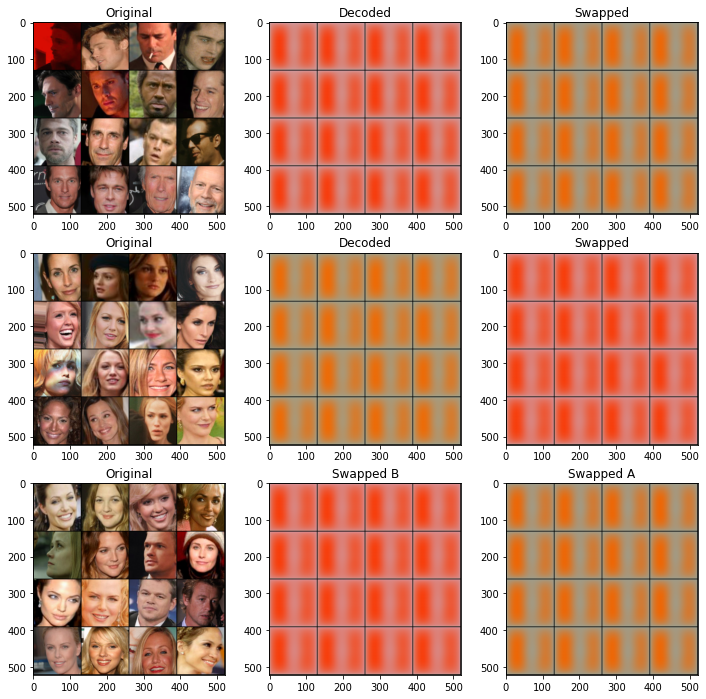

epoch: 1, lossA: 0.19635818274908287, lossB: 0.198949221261712, lossC: 0.19563566564127458
epoch: 2, lossA: 0.17236409215039986, lossB: 0.1706389032824095, lossC: 0.17001549795616505
epoch: 3, lossA: 0.13960764920988747, lossB: 0.14523825222669645, lossC: 0.14171298749225084
epoch: 4, lossA: 0.12686019165571347, lossB: 0.13145894678526146, lossC: 0.1298888098708419
epoch: 5, lossA: 0.1234481161416963, lossB: 0.12675726586996122, lossC: 0.12575069069862366
epoch: 6, lossA: 0.11648536854705145, lossB: 0.11838734201913656, lossC: 0.11857116291689318
epoch: 7, lossA: 0.1131831095662228, lossB: 0.11634132335352343, lossC: 0.11393807585849318
epoch: 8, lossA: 0.1082790034801461, lossB: 0.11058299797911976, lossC: 0.11025572013716366
epoch: 9, lossA: 0.10485319637281951, lossB: 0.10779089775196342, lossC: 0.10660846427429554
epoch: 10, lossA: 0.10379007441359897, lossB: 0.10621981842573298, lossC: 0.1059068502035252
epoch: 11, lossA: 0.1012353827787, lossB: 0.10396419188310933, lossC: 0.10268

In [ ]:
train(n_epochs=30, train_loader_A=train_loader_female, train_loader_B=train_loader_male, model_name="autoencoder128m.pt", print_metrics=1, resume=False)

In [ ]:
train(n_epochs=500, train_loader_A=train_loader_A, train_loader_B=train_loader_B, model_name="autoencoder128m.pt")

===> Load last checkpoint data, resuming from epoch 750
Training...
===> Saving models...
Copying file://./checkpoint/autoencoder128m.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

\
Operation completed over 1 objects/3.0 GiB.                                      


===> Load last checkpoint data, resuming from epoch 750
Training...
epoch: 750, lossA: 0.05228240725894769, lossB: 0.05498468565444151, lossC: 0.06634727492928505
===> Saving models...


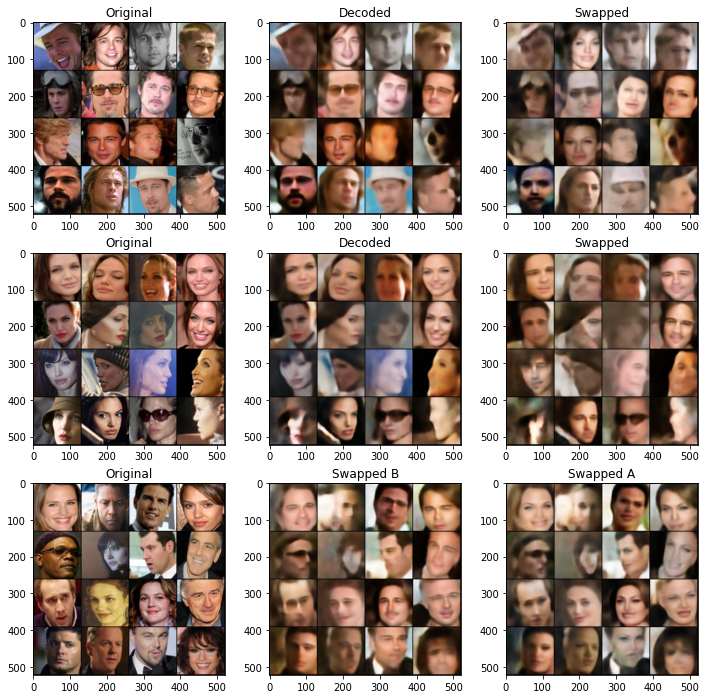

epoch: 760, lossA: 0.05227876206239065, lossB: 0.05392586998641491, lossC: 0.0659907025595506
epoch: 770, lossA: 0.05268177638451258, lossB: 0.05370167704919974, lossC: 0.06595537438988686
epoch: 780, lossA: 0.052302886421481766, lossB: 0.05441919776300589, lossC: 0.06441213376820087
epoch: 790, lossA: 0.051426091541846596, lossB: 0.053284828861554466, lossC: 0.06632594515879948
epoch: 800, lossA: 0.05143580958247185, lossB: 0.05341696490844091, lossC: 0.06485215201973915
epoch: 810, lossA: 0.05336751043796539, lossB: 0.0541605819016695, lossC: 0.06663332134485245
epoch: 820, lossA: 0.05193794146180153, lossB: 0.05188890298207601, lossC: 0.06634849061568578
epoch: 830, lossA: 0.05207508740325769, lossB: 0.052260955174764, lossC: 0.0636785173167785
epoch: 840, lossA: 0.05158176956077417, lossB: 0.052496754874785743, lossC: 0.06629795332749684
epoch: 850, lossA: 0.05260129707554976, lossB: 0.05263702757656574, lossC: 0.06554602459073067
epoch: 860, lossA: 0.05246091137329737, lossB: 0.05

In [ ]:
train(n_epochs=1000, train_loader_A=train_loader_A, train_loader_B=train_loader_B, model_name="autoencoder128m.pt")

===> Load last checkpoint data, resuming from epoch 1499
Training...
epoch: 1500, lossA: 0.04500123423834642, lossB: 0.04692568692068259, lossC: 0.05944433932503065
===> Saving models...


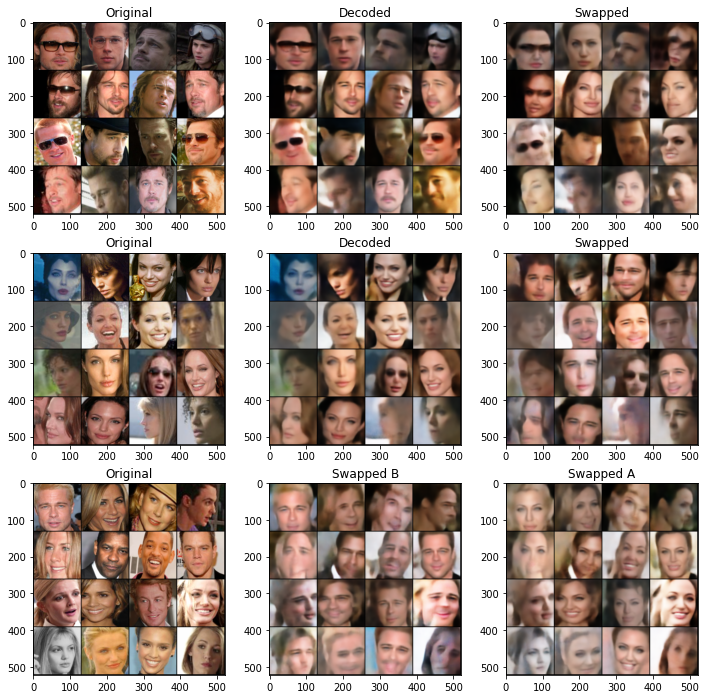

epoch: 1510, lossA: 0.04516481483976046, lossB: 0.04731753778954347, lossC: 0.05979894225796064
epoch: 1520, lossA: 0.043437656636039414, lossB: 0.045109146585067116, lossC: 0.05942954495549202
epoch: 1530, lossA: 0.04475308954715729, lossB: 0.04673626025517782, lossC: 0.05989226574699084
epoch: 1540, lossA: 0.04438474960625172, lossB: 0.046036399280031524, lossC: 0.05877961404621601
epoch: 1550, lossA: 0.04456306310991446, lossB: 0.045650593315561615, lossC: 0.05884001714487871
epoch: 1560, lossA: 0.0455629030863444, lossB: 0.0467926450073719, lossC: 0.059185849502682686
epoch: 1570, lossA: 0.043082346518834434, lossB: 0.04457197027901808, lossC: 0.05817732959985733
epoch: 1580, lossA: 0.043055916825930275, lossB: 0.04484745115041733, lossC: 0.05858496700723966
epoch: 1590, lossA: 0.04358988751967748, lossB: 0.04475420030454794, lossC: 0.05873315719266733
epoch: 1600, lossA: 0.04382792177299658, lossB: 0.04534068269034227, lossC: 0.05932311341166496
epoch: 1610, lossA: 0.0431586485356

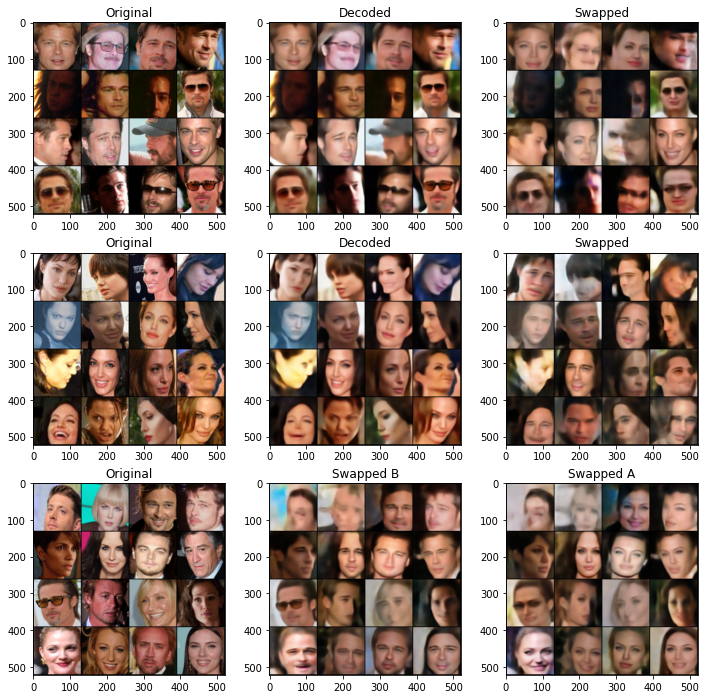

epoch: 1760, lossA: 0.04350050042072932, lossB: 0.04425890495379766, lossC: 0.05751413914064566
epoch: 1770, lossA: 0.04270868996779124, lossB: 0.04369209955135981, lossC: 0.058592635517319046
epoch: 1780, lossA: 0.04393797119458517, lossB: 0.04421197188397249, lossC: 0.059691488121946655
epoch: 1790, lossA: 0.04355672871073087, lossB: 0.0449361993620793, lossC: 0.05782116514941057
epoch: 1800, lossA: 0.04239245131611824, lossB: 0.04258318431675434, lossC: 0.05745821384092172
epoch: 1810, lossA: 0.0421758946031332, lossB: 0.04296309811373552, lossC: 0.05701993343730768
epoch: 1820, lossA: 0.04361585589746634, lossB: 0.044332279513279595, lossC: 0.05743898265063763
epoch: 1830, lossA: 0.04413942868510882, lossB: 0.0446572961906592, lossC: 0.059486384193102516
epoch: 1840, lossA: 0.04300967355569204, lossB: 0.04363152012228966, lossC: 0.05799822323024273
epoch: 1850, lossA: 0.04317157405118147, lossB: 0.04411408367256323, lossC: 0.05713213669757048
epoch: 1860, lossA: 0.04363692986468474

In [ ]:
train(n_epochs=2000, train_loader_A=train_loader_A, train_loader_B=train_loader_B, model_name="autoencoder128m.pt")

===> Load last checkpoint data, resuming from epoch 5999
Training...
epoch: 6000, lossA: 0.03235837320486704, lossB: 0.033982155844569206, lossC: 0.04532672961552938
===> Saving models...


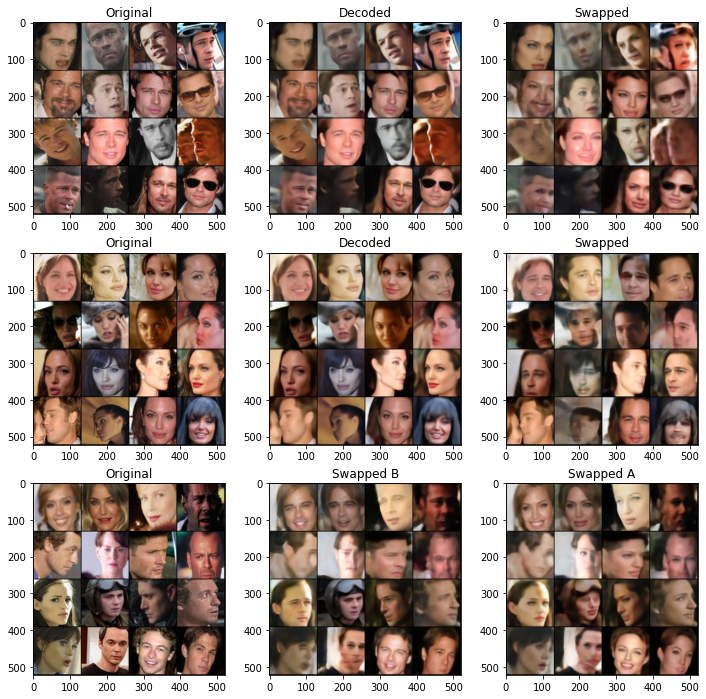

epoch: 6010, lossA: 0.032352207538982235, lossB: 0.033941490575671196, lossC: 0.04478032328188419
epoch: 6020, lossA: 0.03257818644245466, lossB: 0.0338850903014342, lossC: 0.045545694107810654
epoch: 6030, lossA: 0.03261786078413328, lossB: 0.03386264480650425, lossC: 0.04509508050978184
epoch: 6040, lossA: 0.03326656110584736, lossB: 0.03467633140583833, lossC: 0.04505987651646137
epoch: 6050, lossA: 0.032893109445770584, lossB: 0.03404944327970346, lossC: 0.044776578744252525
epoch: 6060, lossA: 0.032677985106905304, lossB: 0.033291323110461235, lossC: 0.04600287415087223
epoch: 6070, lossA: 0.03285777010023594, lossB: 0.03350373667975267, lossC: 0.04502970911562443
epoch: 6080, lossA: 0.03242812460909287, lossB: 0.03383280957738558, lossC: 0.04436051038404306
epoch: 6090, lossA: 0.032838402005533375, lossB: 0.03439679741859436, lossC: 0.045045031855503716
epoch: 6100, lossA: 0.032460419771571956, lossB: 0.033537792041897774, lossC: 0.0443729292601347
epoch: 6110, lossA: 0.032287089

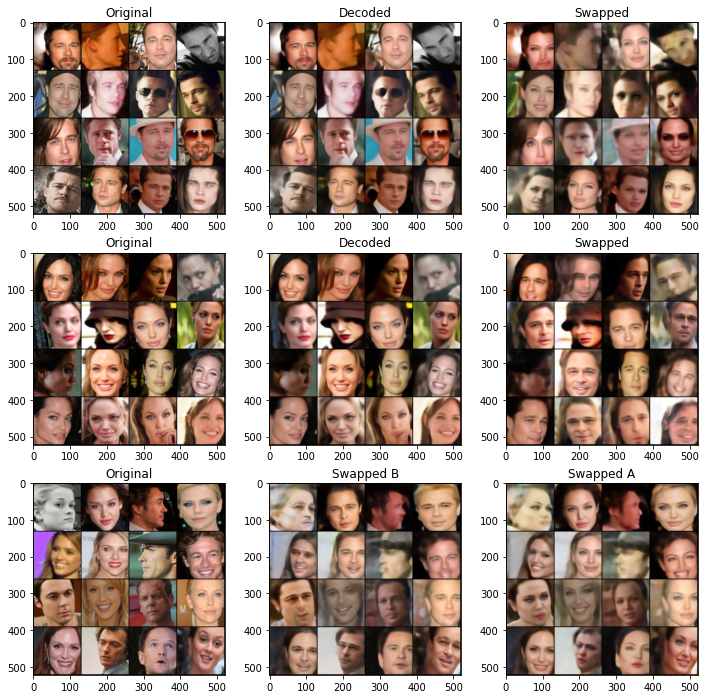

epoch: 6260, lossA: 0.03342333063483238, lossB: 0.0345472035308679, lossC: 0.04605905587474505
epoch: 6270, lossA: 0.03284954962631067, lossB: 0.03374085575342178, lossC: 0.04449114762246609
epoch: 6280, lossA: 0.03208686783909798, lossB: 0.03296607732772827, lossC: 0.045621865118543305
epoch: 6290, lossA: 0.03218442512055238, lossB: 0.03311550927658876, lossC: 0.04400429750482241
epoch: 6300, lossA: 0.032622251038750015, lossB: 0.03290274987618128, lossC: 0.04493740449349085
epoch: 6310, lossA: 0.03289801565309366, lossB: 0.03320998512208462, lossC: 0.044891747956474624
epoch: 6320, lossA: 0.03188096887121598, lossB: 0.03290001923839251, lossC: 0.04506827394167582
epoch: 6330, lossA: 0.032195153956611954, lossB: 0.03345693772037824, lossC: 0.04491624298195044
epoch: 6340, lossA: 0.032065524719655514, lossB: 0.032241144217550755, lossC: 0.045051014671723046
epoch: 6350, lossA: 0.031998932672043644, lossB: 0.03233475827922424, lossC: 0.044838218639294304
epoch: 6360, lossA: 0.0316435281

In [ ]:
train(n_epochs=6500, train_loader_A=train_loader_A, train_loader_B=train_loader_B, model_name="autoencoder128m.pt")

===> Load last checkpoint data, resuming from epoch 9499
Training...
epoch: 9500, lossA: 0.02964082732796669, lossB: 0.0308890783538421, lossC: 0.04190585079292456
===> Saving models...


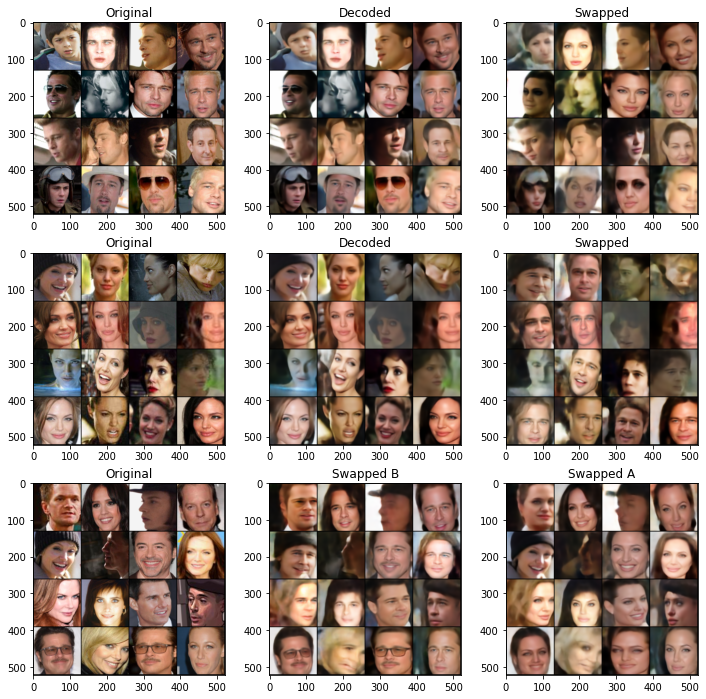

epoch: 9510, lossA: 0.02919584916283687, lossB: 0.030831716023385525, lossC: 0.040721201648314796
epoch: 9520, lossA: 0.0286410649617513, lossB: 0.030410712584853172, lossC: 0.04068653595944246
epoch: 9530, lossA: 0.029187948442995548, lossB: 0.03104353075226148, lossC: 0.04104591409365336
epoch: 9540, lossA: 0.029300169708828133, lossB: 0.03023869140694539, lossC: 0.04168701420227686
epoch: 9550, lossA: 0.029311143793165684, lossB: 0.030731558178861935, lossC: 0.0417072381824255
epoch: 9560, lossA: 0.02953519330670436, lossB: 0.029970275859038036, lossC: 0.04051417484879494
epoch: 9570, lossA: 0.029067724011838436, lossB: 0.029951092476646107, lossC: 0.0415787436068058
epoch: 9580, lossA: 0.02902428588519494, lossB: 0.029853628017008305, lossC: 0.04188288748264313
epoch: 9590, lossA: 0.02934950217604637, lossB: 0.030385170752803486, lossC: 0.0405867670973142
epoch: 9600, lossA: 0.029327545315027237, lossB: 0.03025844879448414, lossC: 0.04106364957988262
epoch: 9610, lossA: 0.029215840

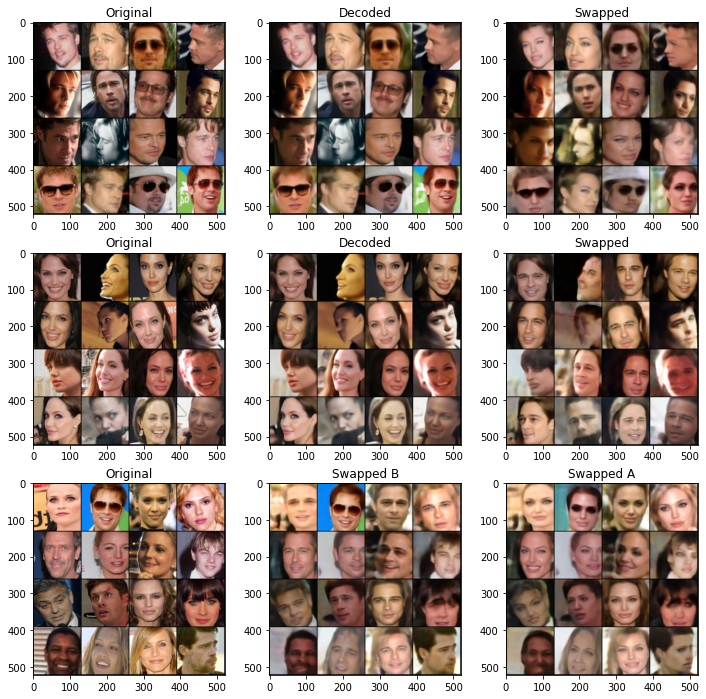

epoch: 9760, lossA: 0.029178048794468243, lossB: 0.02991530392318964, lossC: 0.04203643215199312
epoch: 9770, lossA: 0.0290737006192406, lossB: 0.029380566130081814, lossC: 0.0407553439339002
epoch: 9780, lossA: 0.02876802533864975, lossB: 0.029322446944812935, lossC: 0.04168234641353289
epoch: 9790, lossA: 0.028972464613616467, lossB: 0.02992405431965987, lossC: 0.04165254905819893
epoch: 9800, lossA: 0.028829789410034817, lossB: 0.029819348206122715, lossC: 0.04173181702693304
epoch: 9810, lossA: 0.02928266581147909, lossB: 0.02999991023292144, lossC: 0.04227960233887037
epoch: 9820, lossA: 0.028987656037012737, lossB: 0.02943730043868224, lossC: 0.0409162932386001
epoch: 9830, lossA: 0.02896496995041768, lossB: 0.029321362574895222, lossC: 0.04182643070816994
epoch: 9840, lossA: 0.028859852502743404, lossB: 0.02973880246281624, lossC: 0.04089887750645479
epoch: 9850, lossA: 0.029115285103519756, lossB: 0.030550154857337475, lossC: 0.041188967103759445
epoch: 9860, lossA: 0.028956174

In [ ]:
train(n_epochs=10000, train_loader_A=train_loader_A, train_loader_B=train_loader_B, model_name="autoencoder128m.pt")

===> Load last checkpoint data, resuming from epoch 18499
Training...
epoch: 18500, lossA: 0.026300944077471893, lossB: 0.027960465910534065, lossC: 0.038445560882488884
===> Saving models...


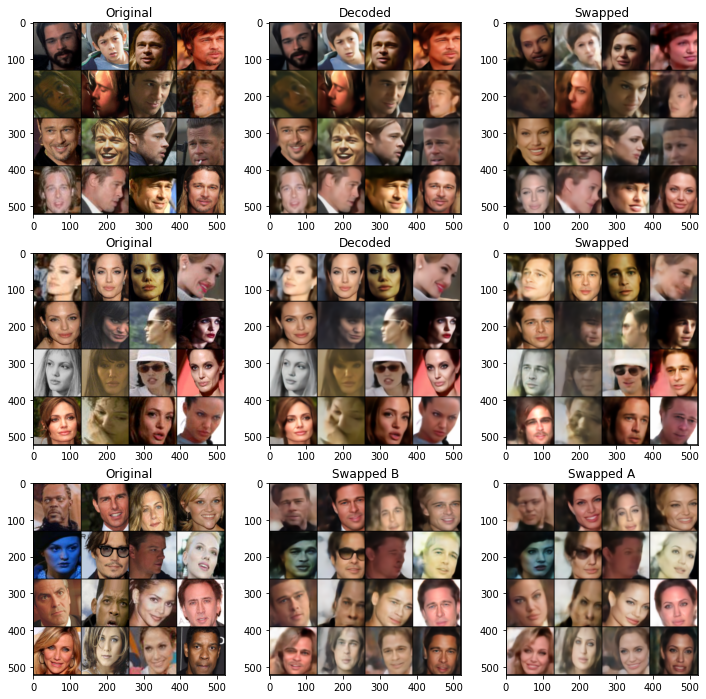

epoch: 18510, lossA: 0.02614504223068555, lossB: 0.02798498763392369, lossC: 0.03782694538434347
epoch: 18520, lossA: 0.026192632814248402, lossB: 0.027284289710223675, lossC: 0.037451608727375664
epoch: 18530, lossA: 0.026035940895477932, lossB: 0.02779824659228325, lossC: 0.038482525696357094
epoch: 18540, lossA: 0.026317816848556202, lossB: 0.027628776617348194, lossC: 0.03876679763197899
epoch: 18550, lossA: 0.025933091528713703, lossB: 0.02756600920110941, lossC: 0.03830374342699846
epoch: 18560, lossA: 0.02588942802200715, lossB: 0.027678328566253185, lossC: 0.03877365527053674
epoch: 18570, lossA: 0.026443093394239742, lossB: 0.027286011415223282, lossC: 0.03808685392141342
epoch: 18580, lossA: 0.02621254324913025, lossB: 0.027072858375807602, lossC: 0.038108273719747864
epoch: 18590, lossA: 0.0261042732745409, lossB: 0.028063363395631313, lossC: 0.03907345235347748
epoch: 18600, lossA: 0.02644657591978709, lossB: 0.027340983971953392, lossC: 0.03801799255112807
epoch: 18610, lo

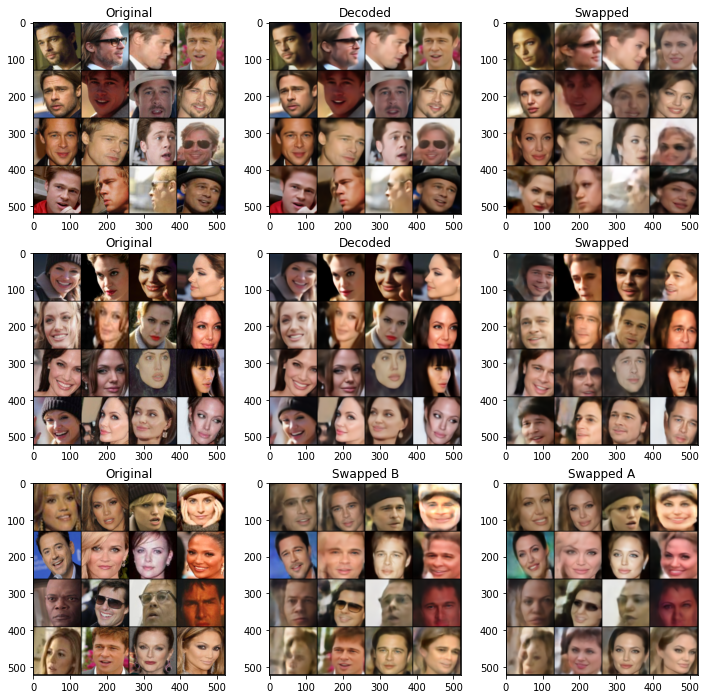

epoch: 18760, lossA: 0.0262865141655008, lossB: 0.027147627746065457, lossC: 0.03833040036261082
epoch: 18770, lossA: 0.026211208663880825, lossB: 0.02713726305713256, lossC: 0.038656964898109436
epoch: 18780, lossA: 0.026088495117922623, lossB: 0.027064383029937744, lossC: 0.038069870322942734
epoch: 18790, lossA: 0.025860801649590332, lossB: 0.027237858933707077, lossC: 0.03811648736397425
epoch: 18800, lossA: 0.02608985019226869, lossB: 0.026231545334060986, lossC: 0.03786151980360349
epoch: 18810, lossA: 0.026018561484913032, lossB: 0.0274536336461703, lossC: 0.038089305783311524
epoch: 18820, lossA: 0.02600859012454748, lossB: 0.026810774579644203, lossC: 0.0384261105209589
epoch: 18830, lossA: 0.02628396327296893, lossB: 0.026549081628521282, lossC: 0.03784783432881037
epoch: 18840, lossA: 0.026064216159284115, lossB: 0.027632356931765873, lossC: 0.03786794965465864
epoch: 18850, lossA: 0.026092595420777798, lossB: 0.027272671771546204, lossC: 0.03749495930969715
epoch: 18860, lo

In [18]:
train(n_epochs=19000, train_loader_A=train_loader_A, train_loader_B=train_loader_B, model_name="autoencoder128m.pt")

In [ ]:
# lr_1.step()
# lr_2.step()

for pg in optimizer_1.param_groups:
  # pg['lr'] = 1e-6
  print(pg['lr'])

for pg in optimizer_2.param_groups:
  # pg['lr'] = 1e-6
  print(pg['lr'])  

for pg in optimizer_3.param_groups:
  # pg['lr'] = 1e-6
  print(pg['lr'])  

1.1891344262766608e-05
1.1891344262766608e-05
1.1891344262766608e-05
1.1891344262766608e-05
1.1891344262766608e-05
1.1891344262766608e-05


In [ ]:
# save_model(10560, "autoencoder128j.pt")

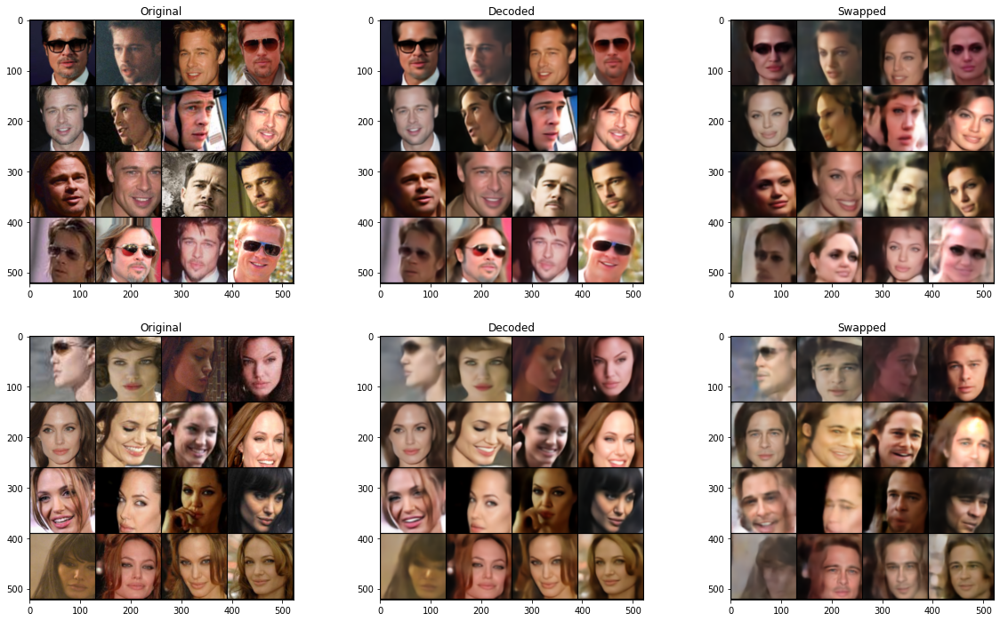

In [19]:
with torch.no_grad():
    warped_A, target_A = next(iter(train_loader_A))
    warped_B, target_B = next(iter(train_loader_B))

    target_A = target_A.cuda()
    target_B = target_B.cuda()

    decoded_A = model(warped_A.cuda(), 'A')
    decoded_B = model(warped_B.cuda(), 'B')
    swapped_A = model(target_A, 'B')
    swapped_B = model(target_B, 'A')

    fig, ax = plt.subplots(2, 3, figsize=(20,12))
    ax[0,0].imshow(np.transpose(vutils.make_grid(target_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,0].set_title("Original")
    ax[0,1].imshow(np.transpose(vutils.make_grid(decoded_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,1].set_title("Decoded")
    ax[0,2].imshow(np.transpose(vutils.make_grid(swapped_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,2].set_title("Swapped")
    ax[1,0].imshow(np.transpose(vutils.make_grid(target_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,0].set_title("Original")
    ax[1,1].imshow(np.transpose(vutils.make_grid(decoded_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,1].set_title("Decoded")
    ax[1,2].imshow(np.transpose(vutils.make_grid(swapped_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,2].set_title("Swapped")
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


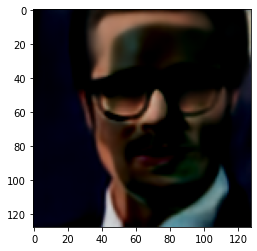

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


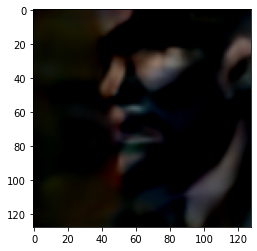

In [20]:
plt.imshow((decoded_B.cuda()[0] - swapped_B[0]).detach().cpu().numpy().transpose((1,2,0)))
plt.show()

plt.imshow((decoded_A.cuda()[0] - swapped_A[0]).detach().cpu().numpy().transpose((1,2,0)))
plt.show()

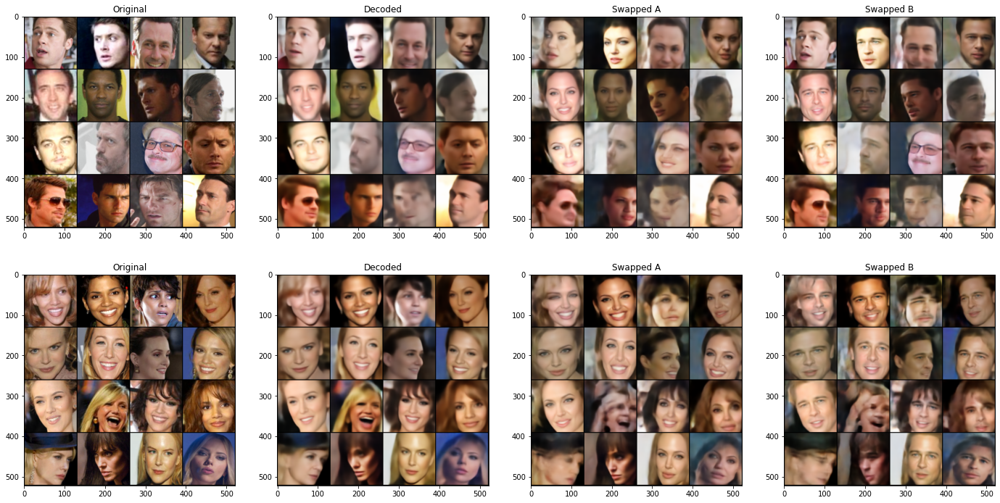

In [21]:
with torch.no_grad():
    warped_A, target_A = next(iter(train_loader_female))
    warped_B, target_B = next(iter(train_loader_male))

    target_A = target_A.cuda()
    target_B = target_B.cuda()

    decoded_A = model(warped_A.cuda(), 'C')
    decoded_B = model(warped_B.cuda(), 'C')
    swapped_AB = model(target_A, 'B')
    swapped_AA = model(target_A, 'A')
    swapped_BB = model(target_B, 'B')
    swapped_BA = model(target_B, 'A')
    
    fig, ax = plt.subplots(2, 4, figsize=(24,12))
    ax[0,0].imshow(np.transpose(vutils.make_grid(target_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,0].set_title("Original")
    ax[0,1].imshow(np.transpose(vutils.make_grid(decoded_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,1].set_title("Decoded")
    ax[0,2].imshow(np.transpose(vutils.make_grid(swapped_BA.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,2].set_title("Swapped A")
    ax[0,3].imshow(np.transpose(vutils.make_grid(swapped_BB.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,3].set_title("Swapped B")
    ax[1,0].imshow(np.transpose(vutils.make_grid(target_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,0].set_title("Original")
    ax[1,1].imshow(np.transpose(vutils.make_grid(decoded_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,1].set_title("Decoded")
    ax[1,2].imshow(np.transpose(vutils.make_grid(swapped_AA.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,2].set_title("Swapped A")
    ax[1,3].imshow(np.transpose(vutils.make_grid(swapped_AB.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,3].set_title("Swapped B")
    plt.show()